In [1]:
import pandas as pd
import moviepy.editor as mpy
import numpy as np
import joblib
from tqdm import tqdm as tqdm
import matplotlib.pyplot as plt

pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html


In [2]:
from isaac.visualization import make_frame_curried
from isaac.constants import FORCE_CLASS_COLS, MASS_CLASS_COLS, BASIC_TRAINING_COLS
from isaac.dataset import normalise, read_dataset
from isaac.models import ComplexRNNModel

In [3]:
all_trials = read_dataset("data/passive_trials.h5")

In [4]:
def get_trial_with(dataset, columns, values):
    for i, trial in enumerate(dataset):
        if (trial[columns].iloc[0] == values).all():
            return i
    
attract = get_trial_with(all_trials, FORCE_CLASS_COLS, [True, False, False])
none = get_trial_with(all_trials, FORCE_CLASS_COLS, [False, True, False])
repel = get_trial_with(all_trials, FORCE_CLASS_COLS, [False, False, True])

In [5]:
random_trial = np.random.randint(0, 1000)
data = pd.read_hdf("data/passive_trials.h5", key="trial_"+str(random_trial))
print("TRIAL", random_trial)
print(data[MASS_CLASS_COLS].iloc[0])
print(data[FORCE_CLASS_COLS].iloc[0])

TRIAL 512
A        True
B       False
same    False
Name: 0, dtype: bool
attract    False
none        True
repel      False
Name: 0, dtype: bool


In [15]:
def visualize_trial(trial_i, all_trials):
    data = all_trials[trial_i]
    make_frame = make_frame_curried(data)
    duration = data.shape[0]/60
    clip = mpy.VideoClip(make_frame, duration=duration)
    return clip

In [7]:
import torch
from torch.nn.functional import softmax

def prepare_data_to_pass_through_model(data, scaler):
    training_cols = np.expand_dims(data[BASIC_TRAINING_COLS], axis=0)
    x_scaled = normalise(training_cols, scaler, fit_scaler=False)
    return torch.from_numpy(x_scaled.astype(np.float32))

def get_hidden_activations(model, batch):
    hidden_activations = []
    n_layers = 3
    batch_size = 1
    hidden_size = 20
    h = torch.zeros(n_layers, batch_size, hidden_size)

    for i in tqdm(range(batch.shape[1])):
        hidden_activations.append(h)
        seq_step = batch[:, i, :].reshape(1, 1, 16)
        out, h = model.lstm(seq_step, h)
    
    return torch.cat(hidden_activations, dim=1)

def get_last_layer_activations(example_i, model, scaler, class_columns):
    batch = prepare_data_to_pass_through_model(all_trials[example_i], scaler)
    probs = softmax(model(batch))
    
    print("Predicted:", class_columns[torch.argmax(probs, dim=1)], 
          "\n\n", all_trials[example_i][class_columns].iloc[0])
    
    hidden_activations = get_hidden_activations(model, batch)
    return hidden_activations[-1].detach().numpy()

# Visualizing activations on mass model

In [24]:
A = get_trial_with(all_trials, MASS_CLASS_COLS, [True, False, False])
B = get_trial_with(all_trials, MASS_CLASS_COLS, [False, True, False])
same = get_trial_with(all_trials, MASS_CLASS_COLS, [False, False, True])

In [22]:
scaler = joblib.load("scalers/passive_mass_scaler.sk")
force_model = ComplexRNNModel(16, 20, 3, 3)
force_model.load_state_dict(torch.load("models/passive_mass_model.pt"))
force_model.eval()

ComplexRNNModel(
  (lstm): GRU(16, 20, num_layers=3, batch_first=True)
  (fc): Linear(in_features=20, out_features=3, bias=True)
)

In [26]:
last_layer_activations = [get_last_layer_activations(example_i, force_model, scaler, MASS_CLASS_COLS)
                          for example_i in [A, B, same]]


 16%|█▌        | 430/2701 [00:00<00:00, 4293.34it/s]

Predicted: A 

 A        True
B       False
same    False
Name: 0, dtype: bool


 17%|█▋        | 456/2701 [00:00<00:00, 4559.68it/s]

Predicted: B 

 A       False
B        True
same    False
Name: 0, dtype: bool


 16%|█▋        | 441/2701 [00:00<00:00, 4401.03it/s]

Predicted: same 

 A       False
B       False
same     True
Name: 0, dtype: bool


100%|██████████| 2701/2701 [00:00<00:00, 4418.03it/s]


In [27]:
last_layer_activations = np.swapaxes(np.array(last_layer_activations), 0, 1)

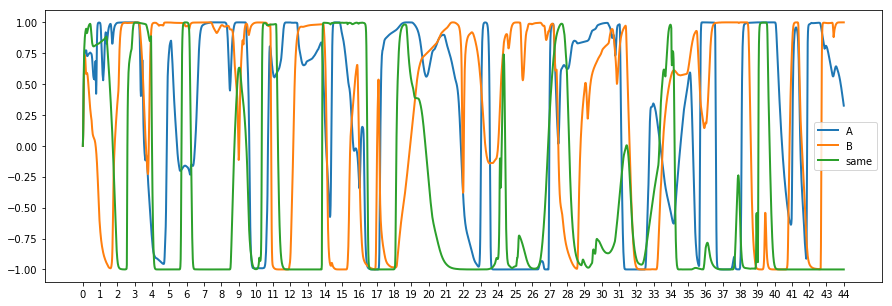

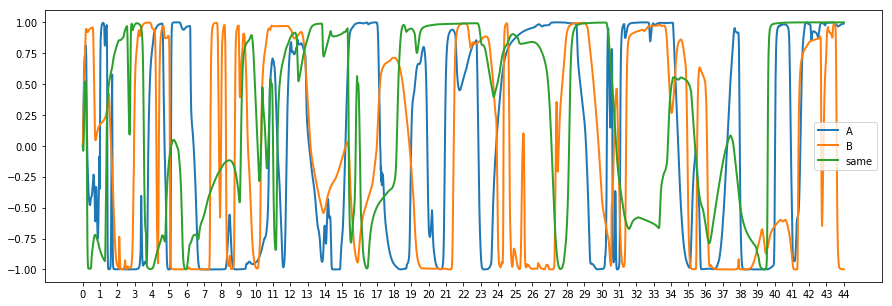

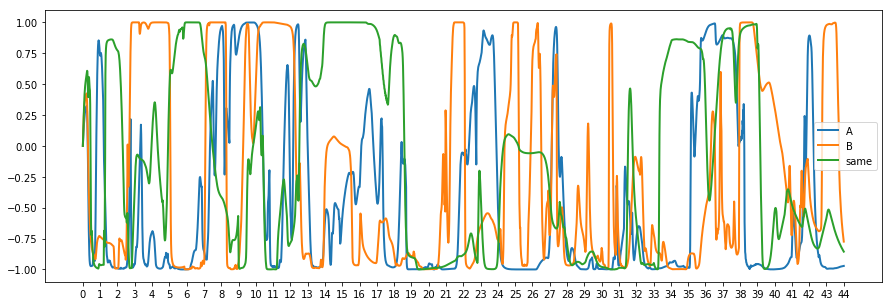

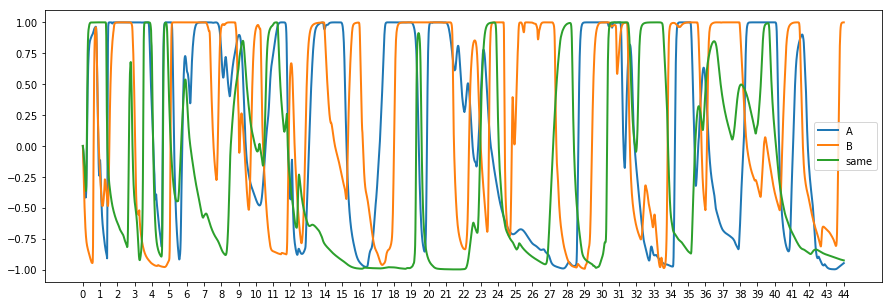

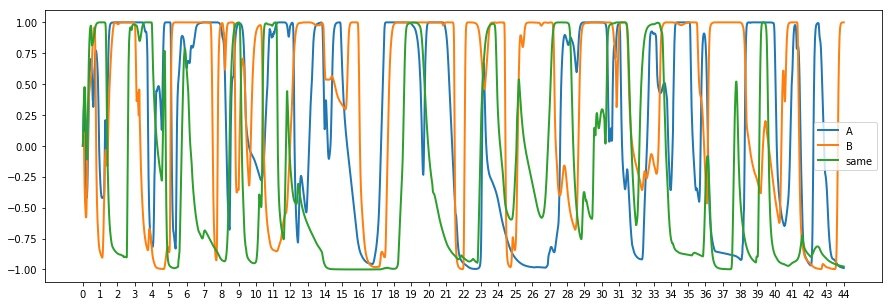

...

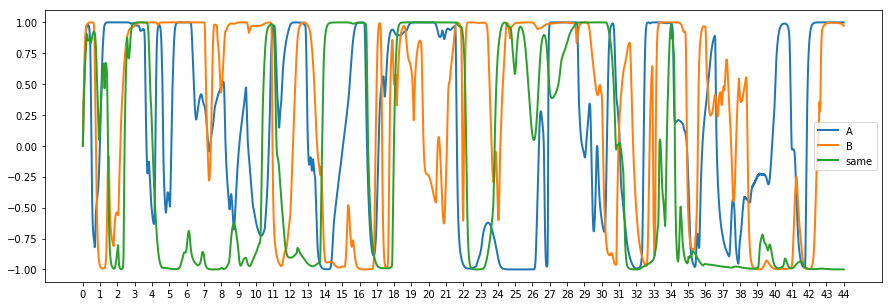

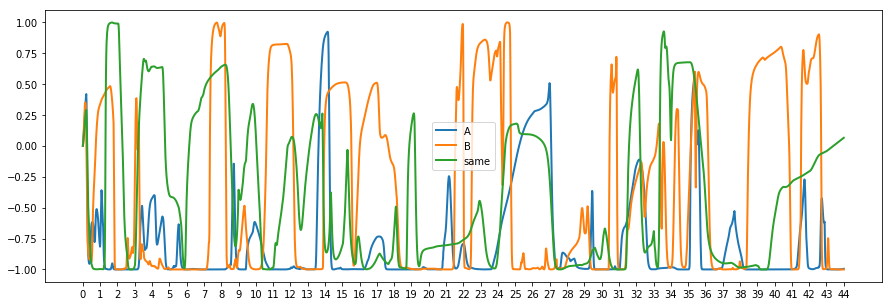

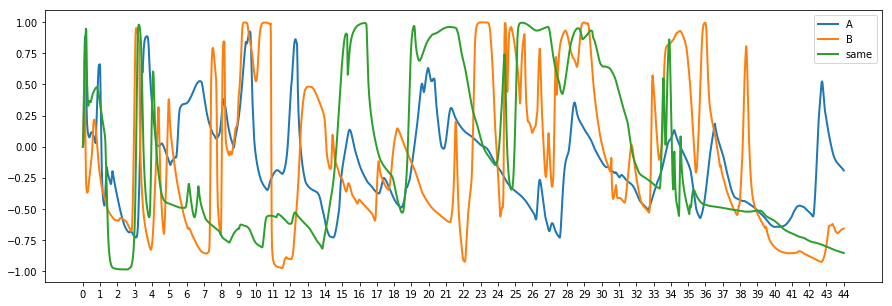

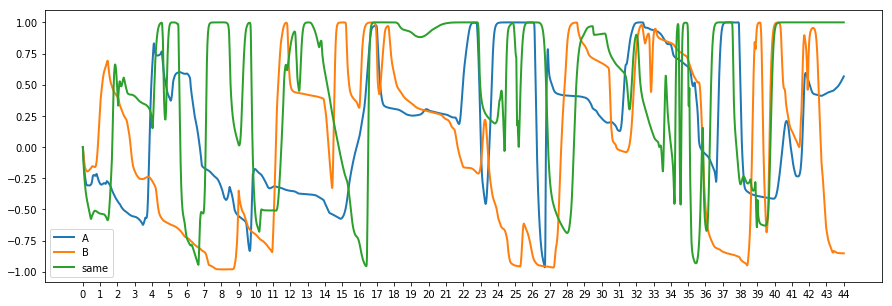

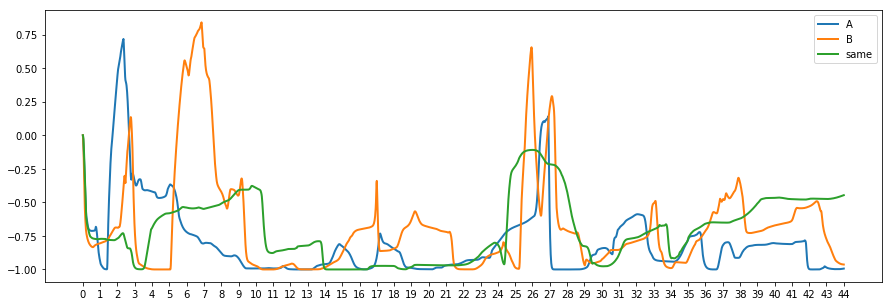

In [29]:
for neuron_i in range(20):
    plt.figure(figsize=(15, 5))
    STEP = 250
    plt.xticks(ticks=np.linspace(0, 2700, 45), labels=np.arange(0, 45))
    line_objects = plt.plot(last_layer_activations[:, :, neuron_i], linewidth=2)
    plt.legend(line_objects, MASS_CLASS_COLS)
    plt.show()

In [31]:
clip = visualize_trial(B, all_trials)
clip.ipython_display(fps=24)

100%|██████████| 1081/1081 [00:07<00:00, 151.49it/s]


# Visualizing activations on force model

In [8]:
attract = get_trial_with(all_trials, FORCE_CLASS_COLS, [True, False, False])
none = get_trial_with(all_trials, FORCE_CLASS_COLS, [False, True, False])
repel = get_trial_with(all_trials, FORCE_CLASS_COLS, [False, False, True])

In [9]:
scaler = joblib.load("scalers/passive_force_scaler.sk")
force_model = ComplexRNNModel(16, 20, 3, 3)
force_model.load_state_dict(torch.load("models/passive_force_model.pt"))
force_model.eval()

ComplexRNNModel(
  (lstm): GRU(16, 20, num_layers=3, batch_first=True)
  (fc): Linear(in_features=20, out_features=3, bias=True)
)

In [11]:
last_layer_activations = [get_last_layer_activations(example_i, force_model, scaler, FORCE_CLASS_COLS)
                          for example_i in [attract, none, repel]]


 15%|█▌        | 416/2701 [00:00<00:00, 4152.90it/s]

Predicted: attract 

 attract     True
none       False
repel      False
Name: 0, dtype: bool


 16%|█▌        | 422/2701 [00:00<00:00, 4213.02it/s]

Predicted: none 

 attract    False
none        True
repel      False
Name: 0, dtype: bool


 14%|█▎        | 369/2701 [00:00<00:00, 3680.13it/s]

Predicted: repel 

 attract    False
none       False
repel       True
Name: 0, dtype: bool


100%|██████████| 2701/2701 [00:00<00:00, 3660.19it/s]


In [12]:
last_layer_activations = np.swapaxes(np.array(last_layer_activations), 0, 1)

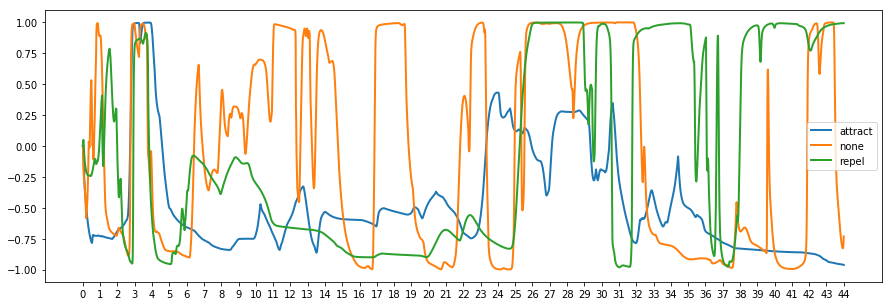

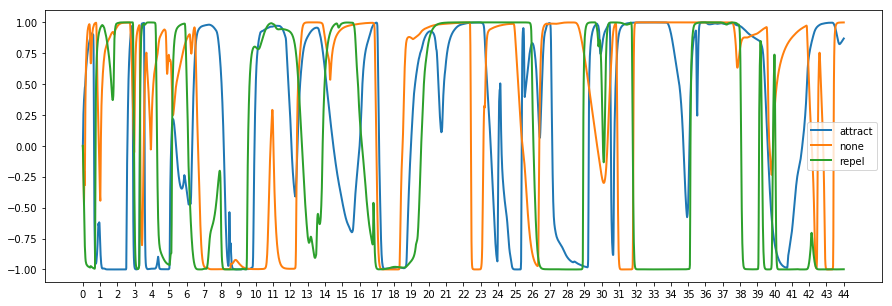

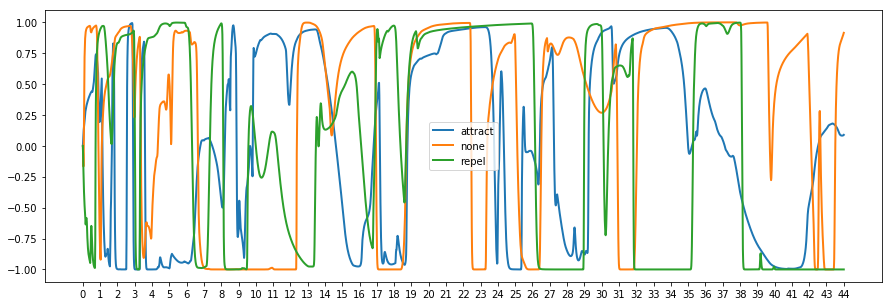

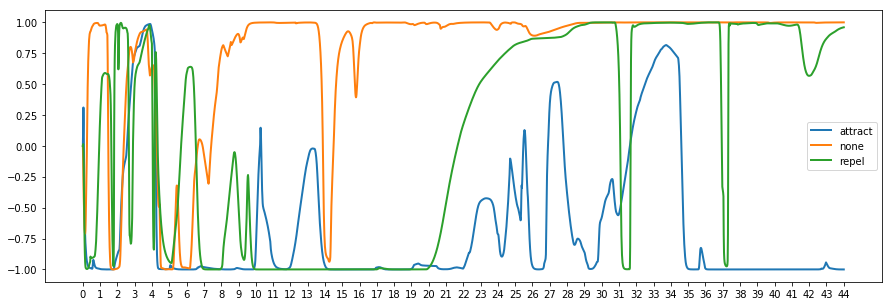

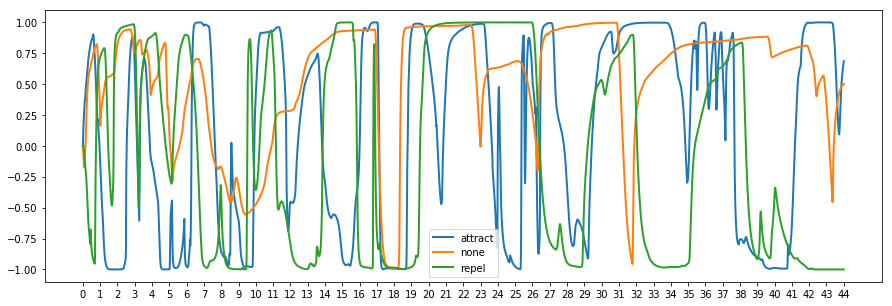

...

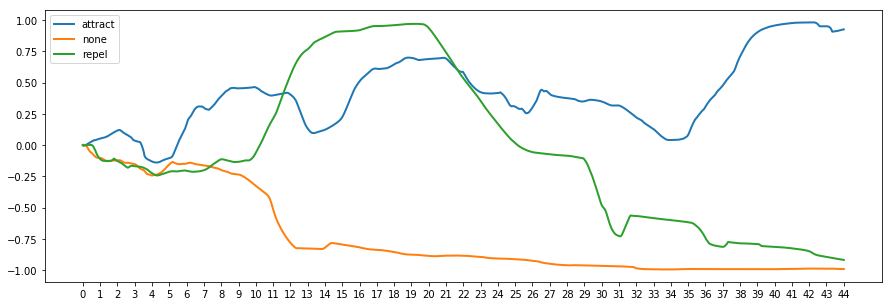

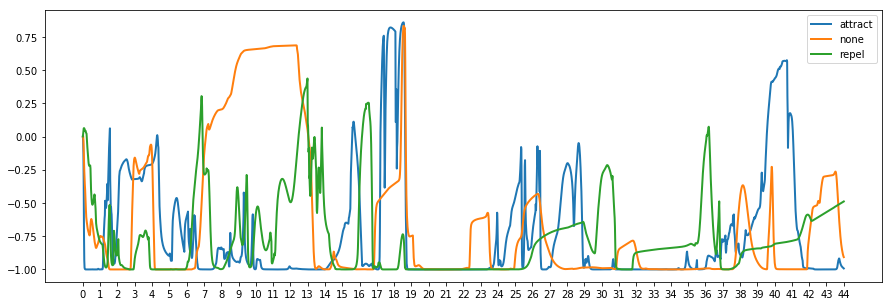

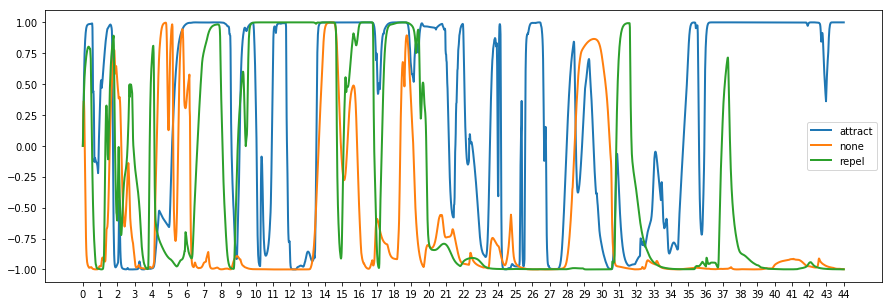

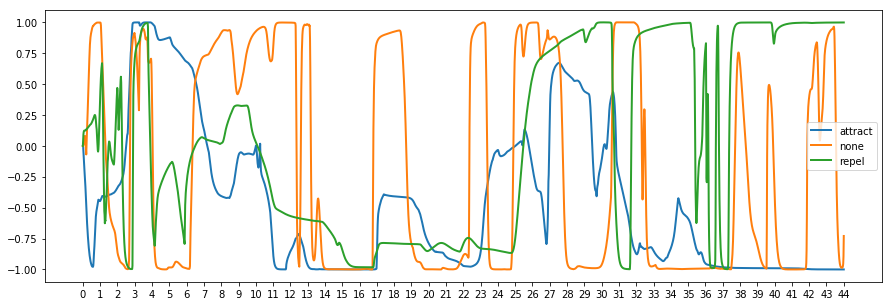

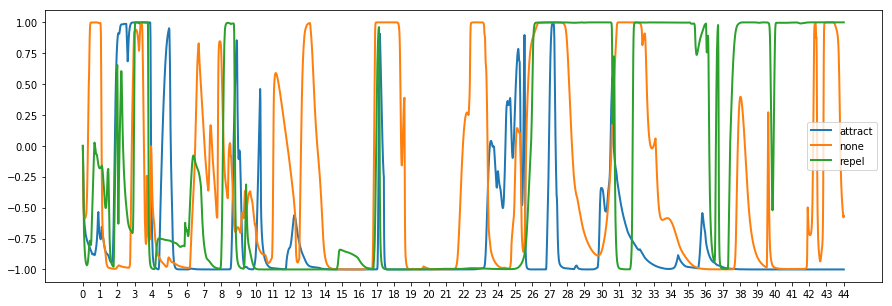

In [13]:
for neuron_i in range(20):
    plt.figure(figsize=(15, 5))
    STEP = 250
    plt.xticks(ticks=np.linspace(0, 2700, 45), labels=np.arange(0, 45))
    line_objects = plt.plot(last_layer_activations[:, :, neuron_i], linewidth=2)
    plt.legend(line_objects, FORCE_CLASS_COLS)
    plt.show()

In [21]:
clip = visualize_trial(none, all_trials)
clip.ipython_display(fps=24)

100%|██████████| 1081/1081 [00:07<00:00, 149.27it/s]
